# Dog Emotion Classification With YOLO 🐶🦴

## Imports

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import ultralytics
from ultralytics import YOLO
import os
import math
import random
import cv2

ultralytics.checks()
%matplotlib inline

Ultralytics 8.3.140  Python-3.9.21 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4080, 16376MiB)
Setup complete  (24 CPUs, 127.8 GB RAM, 1708.8/1863.0 GB disk)


## Helper Methods

In [3]:
results = {}

# Gets all image files in a directory
def get_all_img_files(directory):
    img_files = []
    for dirpath, _, filenames in os.walk(directory):
        for filename in filenames:
            if filename.endswith('.jpg') or filename.endswith('.png') or filename.endswith('.jpeg'):
                img_files.append(dirpath + '/' + filename)
    return img_files

# Runs predictions and then shows results
def test(model, path, num = 20, fs = 20):
    test_image_paths = random.sample(get_all_img_files(path), num)
    n = math.ceil(math.sqrt(len(test_image_paths)))
    
    # Set figure size
    plt.figure(figsize=(15, 15))
    
    for i, path in enumerate(test_image_paths):
        results = model.predict(source=path, save=False, project="predictions", imgsz=img_size)
        img_pil = results[0].plot(font_size=fs, pil=True)
        
        # Convert PIL to numpy array
        img_np = np.array(img_pil)
        
        img_rgb = cv2.cvtColor(img_np, cv2.COLOR_BGR2RGB)
    
        plt.subplot(n, n, i + 1)
        plt.imshow(img_rgb)
        plt.axis('off')
        plt.title(f"Image {i+1}")
    
    plt.tight_layout()
    plt.show()
    
dataset_path = "C:\\Users\\awast\source\\repos\\dog-emotion-detection-YOLO-model\\data\\dog_dataset_gen_big\\dataset.yaml"

## YOLO Model: YOLO11N

In [4]:
model_1 = YOLO('yolo11n.pt')

img_size= 640

results['model_1'] = model_1.train(
    data=dataset_path,
    epochs=2,
    batch=12,
    verbose=True,
    workers=16,
    imgsz=img_size,
    mosaic=1.0,
    hsv_s=1.0,
    hsv_v=1.0,
    patience=5
)

New https://pypi.org/project/ultralytics/8.3.147 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.140  Python-3.9.21 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4080, 16376MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=12, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=C:\Users\awast\source\repos\dog-emotion-detection-YOLO-model\data\dog_dataset_gen_big\dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=1.0, hsv_v=1.0, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic

train: Scanning C:\Users\awast\source\repos\dog-emotion-detection-YOLO-model\data\dog_dataset_gen_big\train\labels.cache... 5526 images, 1 backgrounds, 0 corrupt: 100%|██████████| 5527/5527 [00:00<?, ?it/s]


val: Fast image access  (ping: 0.30.4 ms, read: 835.8290.9 MB/s, size: 535.5 KB)


val: Scanning C:\Users\awast\source\repos\dog-emotion-detection-YOLO-model\data\dog_dataset_gen_big\val\labels.cache... 1184 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1184/1184 [00:00<?, ?it/s]


Plotting labels to runs\detect\train12\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000833, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.00046875), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 16 dataloader workers
Logging results to runs\detect\train12
Starting training for 2 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/2      1.72G       1.39      2.874      1.894         19        640: 100%|██████████| 461/461 [00:27<00:00, 16.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:03<00:00, 13.01it/s]

                   all       1184       1184      0.831      0.729      0.885      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/2      1.91G      1.319      1.862      1.773         21        640: 100%|██████████| 461/461 [00:24<00:00, 18.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:03<00:00, 13.56it/s]

                   all       1184       1184      0.884      0.852      0.937      0.457



2 epochs completed in 0.017 hours.
Optimizer stripped from runs\detect\train12\weights\last.pt, 5.5MB
Optimizer stripped from runs\detect\train12\weights\best.pt, 5.5MB

Validating runs\detect\train12\weights\best.pt...
Ultralytics 8.3.140  Python-3.9.21 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4080, 16376MiB)
YOLO11n summary (fused): 100 layers, 2,583,712 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:04<00:00, 12.26it/s]


                   all       1184       1184      0.879      0.854      0.936      0.457
                 anger        164        164      0.992       0.76      0.958      0.461
              calmness        144        144      0.882      0.982       0.98      0.442
             curiosity        155        155      0.992       0.79      0.986      0.515
            excitement        126        126      0.975       0.62      0.954      0.491
                  fear        170        170      0.963      0.894      0.975      0.486
             happiness        120        120      0.515      0.992      0.748      0.375
               sadness        150        150      0.779      0.947       0.94      0.403
        submissiveness        155        155      0.936      0.846      0.948      0.482
Speed: 0.1ms preprocess, 0.7ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to runs\detect\train12



image 1/1 C:\Users\awast\source\repos\dog-emotion-detection-YOLO-model\notebooks\..\data\portraits_dog\000075.jpg: 448x640 1 happiness, 28.1ms
Speed: 1.6ms preprocess, 28.1ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\awast\source\repos\dog-emotion-detection-YOLO-model\notebooks\..\data\portraits_dog\000028.jpg: 448x640 1 submissiveness, 3.4ms
Speed: 1.1ms preprocess, 3.4ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\awast\source\repos\dog-emotion-detection-YOLO-model\notebooks\..\data\portraits_dog\000065.jpg: 448x640 (no detections), 3.9ms
Speed: 1.0ms preprocess, 3.9ms inference, 0.6ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\awast\source\repos\dog-emotion-detection-YOLO-model\notebooks\..\data\portraits_dog\000018.jpg: 448x640 1 submissiveness, 3.6ms
Speed: 2.0ms preprocess, 3.6ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\awast\so

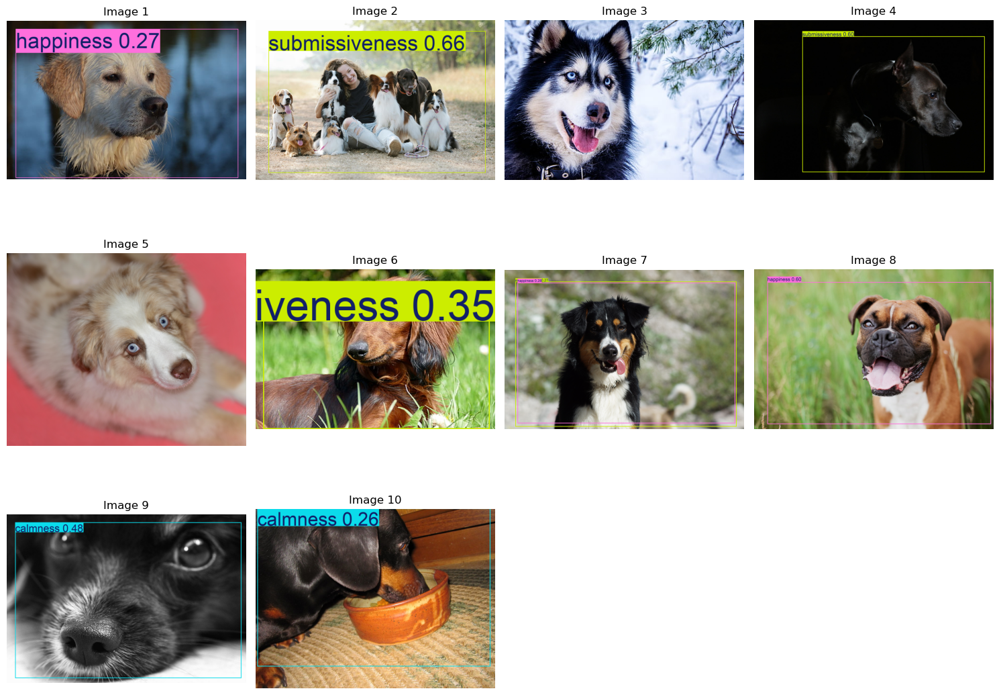

In [5]:
test(model_1, '../data/portraits_dog/', fs=80, num=10)

## YOLO Model: YOLO11X

In [6]:
model_2 = YOLO('yolo11n.pt')

img_size= 640

results['model_2'] = model_2.train(
    data=dataset_path,
    epochs=5,
    batch=12,
    verbose=True,
    workers=16,
    imgsz=img_size,
    patience=5,
    mosaic=1.0,
    hsv_s=1.0,
    hsv_v=1.0
)

New https://pypi.org/project/ultralytics/8.3.147 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.140  Python-3.9.21 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4080, 16376MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=12, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=C:\Users\awast\source\repos\dog-emotion-detection-YOLO-model\data\dog_dataset_gen_big\dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=5, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=1.0, hsv_v=1.0, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic

train: Scanning C:\Users\awast\source\repos\dog-emotion-detection-YOLO-model\data\dog_dataset_gen_big\train\labels.cache... 5526 images, 1 backgrounds, 0 corrupt: 100%|██████████| 5527/5527 [00:00<?, ?it/s]


val: Fast image access  (ping: 0.10.0 ms, read: 1376.2297.7 MB/s, size: 535.5 KB)


val: Scanning C:\Users\awast\source\repos\dog-emotion-detection-YOLO-model\data\dog_dataset_gen_big\val\labels.cache... 1184 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1184/1184 [00:00<?, ?it/s]


Plotting labels to runs\detect\train13\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000833, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.00046875), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 16 dataloader workers
Logging results to runs\detect\train13
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.81G       1.39      2.874      1.894         19        640: 100%|██████████| 461/461 [00:25<00:00, 17.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:03<00:00, 14.07it/s]


                   all       1184       1184      0.831      0.729      0.885      0.443

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.99G      1.339       1.88      1.793         21        640: 100%|██████████| 461/461 [00:23<00:00, 19.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:03<00:00, 14.46it/s]

                   all       1184       1184      0.931      0.922      0.956       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.99G      1.321      1.654      1.769         16        640: 100%|██████████| 461/461 [00:23<00:00, 20.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:03<00:00, 15.16it/s]

                   all       1184       1184      0.856      0.872      0.919      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.99G      1.285      1.488      1.731         18        640: 100%|██████████| 461/461 [00:23<00:00, 19.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:03<00:00, 14.93it/s]

                   all       1184       1184      0.962      0.951      0.989      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.99G      1.271       1.38      1.718         17        640: 100%|██████████| 461/461 [00:23<00:00, 20.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:03<00:00, 15.06it/s]

                   all       1184       1184      0.965       0.98      0.987      0.505



5 epochs completed in 0.038 hours.
Optimizer stripped from runs\detect\train13\weights\last.pt, 5.5MB
Optimizer stripped from runs\detect\train13\weights\best.pt, 5.5MB

Validating runs\detect\train13\weights\best.pt...
Ultralytics 8.3.140  Python-3.9.21 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4080, 16376MiB)
YOLO11n summary (fused): 100 layers, 2,583,712 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:03<00:00, 13.18it/s]


                   all       1184       1184      0.965       0.98      0.987      0.505
                 anger        164        164      0.979      0.988      0.994       0.49
              calmness        144        144      0.948          1      0.984      0.518
             curiosity        155        155      0.911          1       0.97      0.495
            excitement        126        126      0.961          1      0.995      0.514
                  fear        170        170      0.994      0.952      0.994      0.513
             happiness        120        120      0.991       0.95      0.994      0.506
               sadness        150        150      0.986      0.948       0.99      0.499
        submissiveness        155        155      0.952          1      0.972      0.505
Speed: 0.1ms preprocess, 0.7ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to runs\detect\train13



image 1/1 C:\Users\awast\source\repos\dog-emotion-detection-YOLO-model\notebooks\..\data\portraits_dog\000075.jpg: 448x640 1 curiosity, 4.2ms
Speed: 1.1ms preprocess, 4.2ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\awast\source\repos\dog-emotion-detection-YOLO-model\notebooks\..\data\portraits_dog\000028.jpg: 448x640 1 submissiveness, 3.5ms
Speed: 1.2ms preprocess, 3.5ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\awast\source\repos\dog-emotion-detection-YOLO-model\notebooks\..\data\portraits_dog\000065.jpg: 448x640 (no detections), 5.3ms
Speed: 1.0ms preprocess, 5.3ms inference, 0.8ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\awast\source\repos\dog-emotion-detection-YOLO-model\notebooks\..\data\portraits_dog\000018.jpg: 448x640 1 submissiveness, 3.6ms
Speed: 1.6ms preprocess, 3.6ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\awast\sour

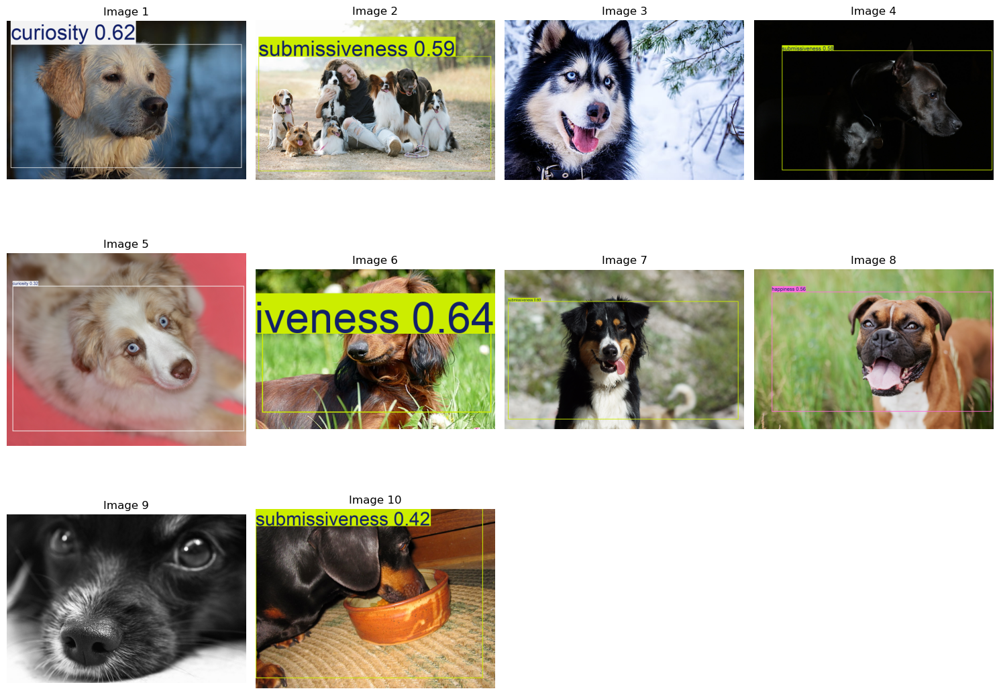

In [7]:
test(model_2, '../data/portraits_dog/', fs=80, num=10)

## YOLO Model: YOLO11L-FACE PT Base

In [8]:
model_3 = YOLO('yolov11l-face.pt')

img_size= 640

results['model_3'] = model_3.train(
    data=dataset_path,
    epochs=3,
    batch=2,
    verbose=True,
    workers=16,
    imgsz=img_size,
    patience=2,
    mosaic=1.0,
    hsv_s=1.0,
    hsv_v=1.0
)

New https://pypi.org/project/ultralytics/8.3.147 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.140  Python-3.9.21 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4080, 16376MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=2, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=C:\Users\awast\source\repos\dog-emotion-detection-YOLO-model\data\dog_dataset_gen_big\dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=3, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=1.0, hsv_v=1.0, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov11l-face.pt, momentum=0.937, m

train: Scanning C:\Users\awast\source\repos\dog-emotion-detection-YOLO-model\data\dog_dataset_gen_big\train\labels.cache... 5526 images, 1 backgrounds, 0 corrupt: 100%|██████████| 5527/5527 [00:00<?, ?it/s]


val: Fast image access  (ping: 0.20.1 ms, read: 891.3237.2 MB/s, size: 535.5 KB)


val: Scanning C:\Users\awast\source\repos\dog-emotion-detection-YOLO-model\data\dog_dataset_gen_big\val\labels.cache... 1184 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1184/1184 [00:00<?, ?it/s]


Plotting labels to runs\detect\train14\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000833, momentum=0.9) with parameter groups 167 weight(decay=0.0), 174 weight(decay=0.0005), 173 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 16 dataloader workers
Logging results to runs\detect\train14
Starting training for 3 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/3      1.92G      1.553      2.357      2.059          4        640: 100%|██████████| 2764/2764 [02:49<00:00, 16.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 296/296 [00:09<00:00, 32.58it/s]

                   all       1184       1184      0.411      0.822      0.578      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/3      2.13G      1.454       1.86      1.939          4        640: 100%|██████████| 2764/2764 [02:43<00:00, 16.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 296/296 [00:09<00:00, 30.52it/s]

                   all       1184       1184      0.593      0.813      0.771      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/3      2.13G      1.405      1.642      1.884          1        640: 100%|██████████| 2764/2764 [02:37<00:00, 17.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 296/296 [00:09<00:00, 31.00it/s]

                   all       1184       1184      0.884       0.93      0.955      0.478



3 epochs completed in 0.145 hours.
Optimizer stripped from runs\detect\train14\weights\last.pt, 51.2MB
Optimizer stripped from runs\detect\train14\weights\best.pt, 51.2MB

Validating runs\detect\train14\weights\best.pt...
Ultralytics 8.3.140  Python-3.9.21 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4080, 16376MiB)
YOLO11l summary (fused): 190 layers, 25,285,480 parameters, 0 gradients, 86.6 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 296/296 [00:07<00:00, 41.29it/s]


                   all       1184       1184      0.884      0.929      0.955      0.478
                 anger        164        164      0.969      0.773       0.96      0.465
              calmness        144        144      0.815          1      0.982      0.478
             curiosity        155        155      0.883      0.973       0.96      0.497
            excitement        126        126      0.893      0.992      0.938      0.438
                  fear        170        170      0.749      0.906      0.923      0.461
             happiness        120        120      0.899      0.867      0.922       0.47
               sadness        150        150      0.941      0.953      0.977      0.501
        submissiveness        155        155      0.921      0.972      0.979      0.514
Speed: 0.2ms preprocess, 3.5ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to runs\detect\train14



image 1/1 C:\Users\awast\source\repos\dog-emotion-detection-YOLO-model\notebooks\..\data\portraits_dog\000075.jpg: 448x640 1 submissiveness, 28.1ms
Speed: 1.4ms preprocess, 28.1ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\awast\source\repos\dog-emotion-detection-YOLO-model\notebooks\..\data\portraits_dog\000028.jpg: 448x640 1 excitement, 7.9ms
Speed: 1.2ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\awast\source\repos\dog-emotion-detection-YOLO-model\notebooks\..\data\portraits_dog\000065.jpg: 448x640 1 anger, 6.6ms
Speed: 1.3ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\awast\source\repos\dog-emotion-detection-YOLO-model\notebooks\..\data\portraits_dog\000018.jpg: 448x640 1 submissiveness, 7.4ms
Speed: 2.0ms preprocess, 7.4ms inference, 4.2ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\awast\source\re

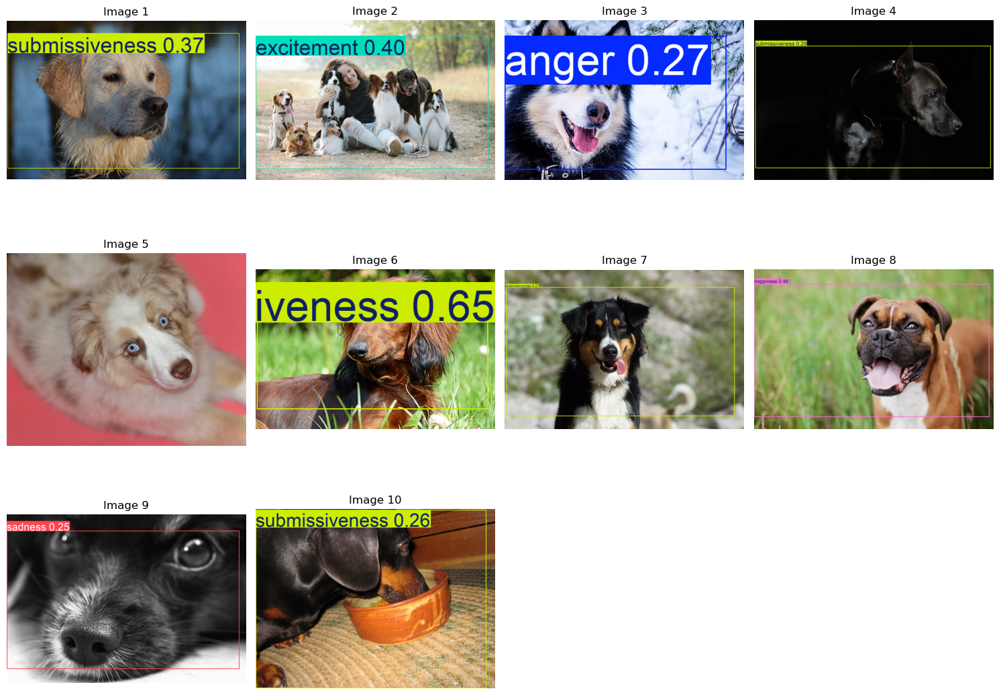

In [9]:
test(model_3, '../data/portraits_dog/', fs=80, num=10)

## YOLO Model: YOLO11L-FACE PT Medium

In [10]:
model_4 = YOLO('yolov11l-face.pt')

img_size= 640

results['model_4'] = model_4.train(
    data=dataset_path,
    epochs=5,
    batch=16,
    verbose=True,
    workers=16,
    imgsz=img_size,
    patience=5,
    mosaic=1.0,
    hsv_s=1.0,
    hsv_v=1.0,
)

New https://pypi.org/project/ultralytics/8.3.147 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.140  Python-3.9.21 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4080, 16376MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=C:\Users\awast\source\repos\dog-emotion-detection-YOLO-model\data\dog_dataset_gen_big\dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=5, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=1.0, hsv_v=1.0, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov11l-face.pt, momentum=0.937, 

train: Scanning C:\Users\awast\source\repos\dog-emotion-detection-YOLO-model\data\dog_dataset_gen_big\train\labels.cache... 5526 images, 1 backgrounds, 0 corrupt: 100%|██████████| 5527/5527 [00:00<?, ?it/s]


val: Fast image access  (ping: 1.32.6 ms, read: 1017.0319.7 MB/s, size: 535.5 KB)


val: Scanning C:\Users\awast\source\repos\dog-emotion-detection-YOLO-model\data\dog_dataset_gen_big\val\labels.cache... 1184 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1184/1184 [00:00<?, ?it/s]


Plotting labels to runs\detect\train15\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000833, momentum=0.9) with parameter groups 167 weight(decay=0.0), 174 weight(decay=0.0005), 173 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 16 dataloader workers
Logging results to runs\detect\train15
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      10.7G      1.476       2.37      1.957         16        640: 100%|██████████| 346/346 [01:22<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:07<00:00,  5.21it/s]

                   all       1184       1184      0.548      0.708      0.705      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      10.9G      1.436      1.593       1.88         18        640: 100%|██████████| 346/346 [01:17<00:00,  4.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:06<00:00,  5.31it/s]

                   all       1184       1184      0.862      0.877      0.934      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      10.9G      1.418      1.431      1.851         22        640: 100%|██████████| 346/346 [01:13<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:06<00:00,  5.33it/s]

                   all       1184       1184      0.936      0.925      0.977      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      10.9G       1.38      1.312       1.81         16        640: 100%|██████████| 346/346 [01:13<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:06<00:00,  5.31it/s]

                   all       1184       1184       0.96      0.961       0.99      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      10.9G      1.334      1.228      1.775         23        640: 100%|██████████| 346/346 [01:13<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:06<00:00,  5.33it/s]

                   all       1184       1184      0.966      0.985      0.991      0.529



5 epochs completed in 0.117 hours.
Optimizer stripped from runs\detect\train15\weights\last.pt, 51.2MB
Optimizer stripped from runs\detect\train15\weights\best.pt, 51.2MB

Validating runs\detect\train15\weights\best.pt...
Ultralytics 8.3.140  Python-3.9.21 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4080, 16376MiB)
YOLO11l summary (fused): 190 layers, 25,285,480 parameters, 0 gradients, 86.6 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:06<00:00,  5.45it/s]


                   all       1184       1184       0.96      0.961       0.99       0.53
                 anger        164        164      0.994      0.964      0.993      0.532
              calmness        144        144      0.986      0.983      0.995      0.521
             curiosity        155        155      0.987      0.981      0.994      0.538
            excitement        126        126      0.915       0.96      0.985      0.531
                  fear        170        170      0.993       0.86      0.993      0.542
             happiness        120        120      0.907      0.972      0.974      0.513
               sadness        150        150      0.952      0.987      0.993      0.511
        submissiveness        155        155      0.944      0.984      0.993      0.549
Speed: 0.1ms preprocess, 3.5ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to runs\detect\train15



image 1/1 C:\Users\awast\source\repos\dog-emotion-detection-YOLO-model\notebooks\..\data\portraits_dog\000075.jpg: 448x640 1 curiosity, 1 submissiveness, 8.9ms
Speed: 1.2ms preprocess, 8.9ms inference, 1.1ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\awast\source\repos\dog-emotion-detection-YOLO-model\notebooks\..\data\portraits_dog\000028.jpg: 448x640 1 excitement, 1 submissiveness, 8.7ms
Speed: 1.2ms preprocess, 8.7ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\awast\source\repos\dog-emotion-detection-YOLO-model\notebooks\..\data\portraits_dog\000065.jpg: 448x640 1 happiness, 6.3ms
Speed: 1.1ms preprocess, 6.3ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\awast\source\repos\dog-emotion-detection-YOLO-model\notebooks\..\data\portraits_dog\000018.jpg: 448x640 (no detections), 6.3ms
Speed: 1.6ms preprocess, 6.3ms inference, 0.5ms postprocess per image at shape (1, 3, 448, 640)

im

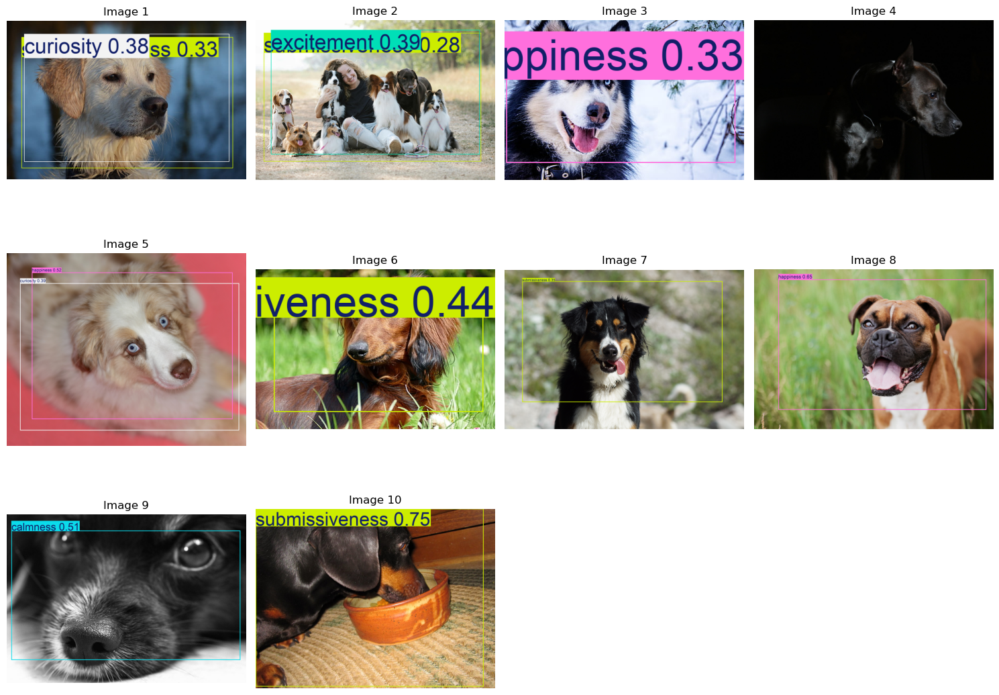

In [11]:
test(model_4, '../data/portraits_dog/', fs=80, num=10)

## Champion YOLO Model: YOLO11L-FACE PT Large

In [12]:
model = YOLO('yolov11l-face.pt')

img_size= 640

results['model_champion'] = model.train(
    data=dataset_path,
    epochs=8,
    batch=16,
    verbose=True,
    workers=16,
    imgsz=img_size,
    patience=5,
    mosaic=1.0
)

New https://pypi.org/project/ultralytics/8.3.147 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.140  Python-3.9.21 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4080, 16376MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=C:\Users\awast\source\repos\dog-emotion-detection-YOLO-model\data\dog_dataset_gen_big\dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=8, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov11l-face.pt, momentum=0.937, 

train: Scanning C:\Users\awast\source\repos\dog-emotion-detection-YOLO-model\data\dog_dataset_gen_big\train\labels.cache... 5526 images, 1 backgrounds, 0 corrupt: 100%|██████████| 5527/5527 [00:00<?, ?it/s]


val: Fast image access  (ping: 0.20.1 ms, read: 803.4537.3 MB/s, size: 535.5 KB)


val: Scanning C:\Users\awast\source\repos\dog-emotion-detection-YOLO-model\data\dog_dataset_gen_big\val\labels.cache... 1184 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1184/1184 [00:00<?, ?it/s]


Plotting labels to runs\detect\train16\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000833, momentum=0.9) with parameter groups 167 weight(decay=0.0), 174 weight(decay=0.0005), 173 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 16 dataloader workers
Logging results to runs\detect\train16
Starting training for 8 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/8      11.3G      1.465      2.283      1.948         16        640: 100%|██████████| 346/346 [01:25<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:07<00:00,  4.94it/s]

                   all       1184       1184      0.632       0.76       0.85       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/8      11.5G      1.434      1.521      1.876         18        640: 100%|██████████| 346/346 [01:16<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:07<00:00,  4.77it/s]

                   all       1184       1184      0.834      0.846       0.93      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/8      11.5G      1.415        1.4      1.846         22        640: 100%|██████████| 346/346 [01:15<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:07<00:00,  4.88it/s]

                   all       1184       1184      0.927      0.897      0.976      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/8      11.5G      1.396      1.298      1.821         16        640: 100%|██████████| 346/346 [01:13<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:06<00:00,  5.38it/s]

                   all       1184       1184      0.975      0.982      0.992      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/8      11.4G      1.355      1.236      1.791         23        640: 100%|██████████| 346/346 [01:09<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:06<00:00,  5.70it/s]

                   all       1184       1184      0.958      0.971      0.988      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        6/8      11.5G      1.346      1.179      1.774         21        640: 100%|██████████| 346/346 [01:09<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:06<00:00,  5.72it/s]


                   all       1184       1184      0.978      0.948      0.985      0.527

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        7/8      11.4G       1.32      1.141      1.758         16        640: 100%|██████████| 346/346 [01:09<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:06<00:00,  5.74it/s]

                   all       1184       1184       0.98      0.986      0.994      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        8/8      11.5G      1.298      1.104      1.738         14        640: 100%|██████████| 346/346 [01:09<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:06<00:00,  5.68it/s]

                   all       1184       1184      0.992      0.987      0.995       0.54



8 epochs completed in 0.181 hours.
Optimizer stripped from runs\detect\train16\weights\last.pt, 51.2MB
Optimizer stripped from runs\detect\train16\weights\best.pt, 51.2MB

Validating runs\detect\train16\weights\best.pt...
Ultralytics 8.3.140  Python-3.9.21 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4080, 16376MiB)
YOLO11l summary (fused): 190 layers, 25,285,480 parameters, 0 gradients, 86.6 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:06<00:00,  5.77it/s]


                   all       1184       1184      0.992      0.987      0.995      0.541
                 anger        164        164          1      0.983      0.995      0.538
              calmness        144        144      0.986      0.984      0.995       0.53
             curiosity        155        155      0.998          1      0.995      0.547
            excitement        126        126          1      0.965      0.995      0.538
                  fear        170        170      0.998      0.988      0.995      0.544
             happiness        120        120      0.963      0.992      0.993      0.531
               sadness        150        150      0.993      0.984      0.995      0.547
        submissiveness        155        155      0.998          1      0.995      0.551
Speed: 0.1ms preprocess, 3.3ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to runs\detect\train16



image 1/1 C:\Users\awast\source\repos\Dog-Emotion\notebooks\..\dog_dataset_gen_big\test\images\443_curly_anger_young_brown.png: 640x640 1 anger, 36.5ms
Speed: 1.5ms preprocess, 36.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\awast\source\repos\Dog-Emotion\notebooks\..\dog_dataset_gen_big\test\images\890_curly_sadness_old_brown.png: 640x640 1 sadness, 165.2ms
Speed: 3.0ms preprocess, 165.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\awast\source\repos\Dog-Emotion\notebooks\..\dog_dataset_gen_big\test\images\318_short-hair_sadness_young_white.png: 640x640 1 sadness, 9.4ms
Speed: 1.5ms preprocess, 9.4ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\awast\source\repos\Dog-Emotion\notebooks\..\dog_dataset_gen_big\test\images\539_short-hair_curiosity_young_brown.png: 640x640 1 curiosity, 7.3ms
Speed: 1.6ms preprocess, 7.3ms inference, 1.0ms postprocess per image at s

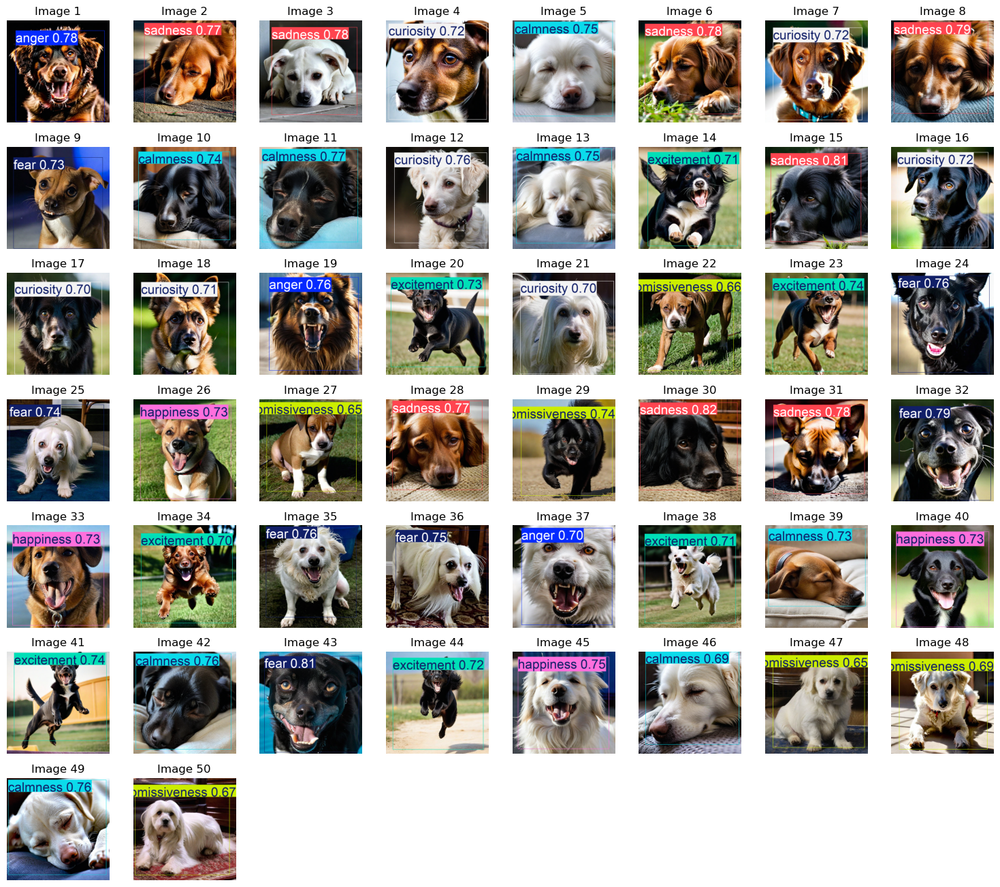

In [13]:
test('../data/dog_dataset_gen_big/test/images/', 50, 80)

## Testing On Real World Data


image 1/1 C:\Users\awast\source\repos\Dog-Emotion\notebooks\..\portraits_dog\000046.jpg: 448x640 (no detections), 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 0.4ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\awast\source\repos\Dog-Emotion\notebooks\..\portraits_dog\000050.jpg: 448x640 1 submissiveness, 6.2ms
Speed: 1.8ms preprocess, 6.2ms inference, 0.9ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\awast\source\repos\Dog-Emotion\notebooks\..\portraits_dog\000085.jpg: 448x640 1 submissiveness, 6.8ms
Speed: 1.3ms preprocess, 6.8ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\awast\source\repos\Dog-Emotion\notebooks\..\portraits_dog\000033.jpg: 480x640 1 calmness, 6.9ms
Speed: 1.5ms preprocess, 6.9ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\awast\source\repos\Dog-Emotion\notebooks\..\portraits_dog\000020.jpg: 512x640 1 submissiveness, 7.0ms
Speed: 1.7ms 

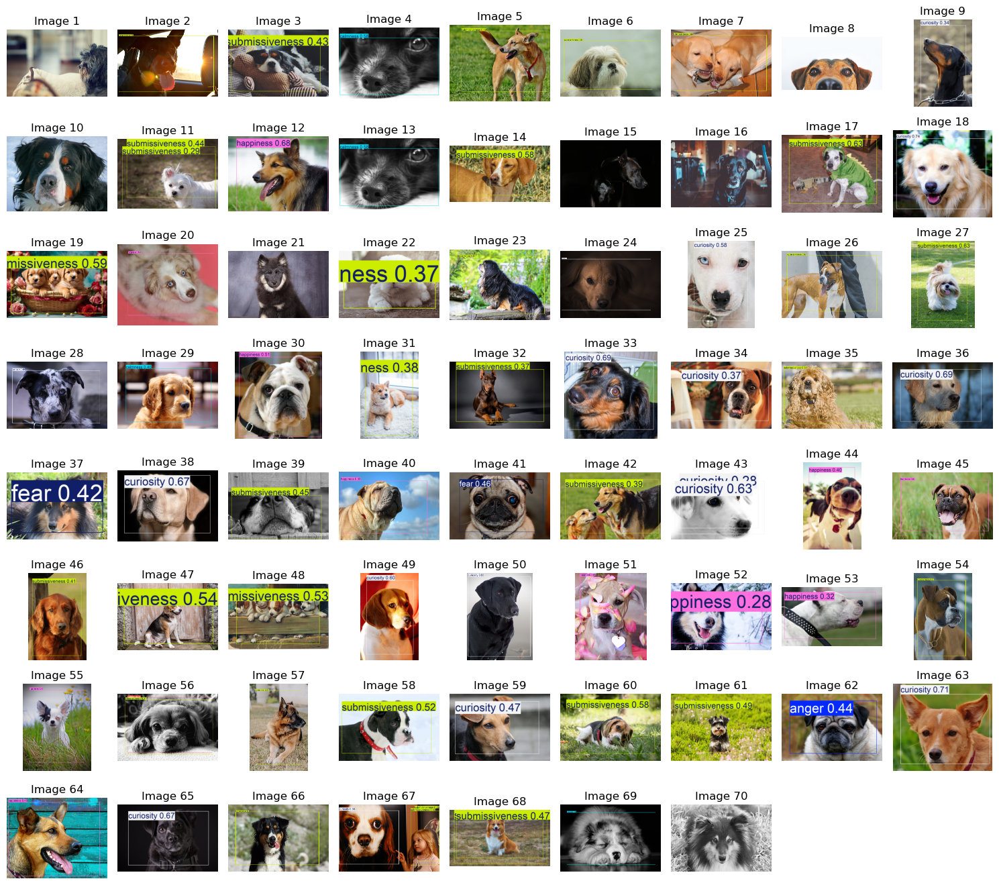

In [16]:
test('../data/portraits_dog/', fs=80, num=70)